<a href="https://colab.research.google.com/github/pttrilok/practical_deep_learning/blob/master/Lesson_4_Computer_Vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

***Hello Everyone , Welcome to Lesson 4 Compute Vision***

In this module we will learn about 


*   Stochastic Gradient Descent(SGD) from scratch
*   more details about basics concept of neural networks
*   how to build projects





***As always We will start with demo..Just look that carefully and visualize***

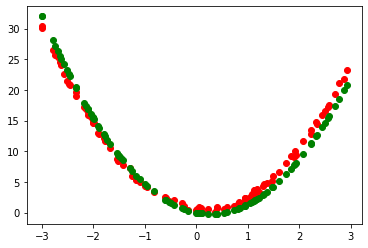

In [ ]:
#Showing demo 

# ***Concept 1 Stochastic Gradient Descent(SGD) from scratch***

***Stochastic Gradient Descent***

The word ‘stochastic‘ means a system or a process that is linked with a random probability. Hence, in Stochastic Gradient Descent, a few samples are selected randomly instead of the whole data set for each iteration.

***What is the objective of Gradient Descent?***

Gradient, in plain terms means slope or slant of a surface. So gradient descent literally means descending a slope to reach the lowest point on that surface

***Importing required libraries***

In [ ]:
%matplotlib inline
from fastai.basics import *
from matplotlib import animation, rc
rc('animation', html='jshtml')

***Defining no of samples to work with***

In [ ]:
n = 100

***Generating random sample using torch***

one important thing is to be noted that ** is power function in python

In [ ]:
x = torch.ones(n,3) 
x[:,2].uniform_(-3.,3)
x[:,0] = x[:,2]**2
x[:,1] = x[:,2]
x[:5]

tensor([[ 7.6679,  2.7691,  2.7691],
        [ 6.1956,  2.4891,  2.4891],
        [ 0.1590,  0.3987,  0.3987],
        [ 2.9992, -1.7318, -1.7318],
        [ 2.2529, -1.5010, -1.5010]])

***Defining actual paramters for our calculation***

In [ ]:
a = tensor(3.,1, -2); a #tensor of a1 a2 and a3

tensor([ 3.,  1., -2.])

***b is considered by us just as random values and I have chose these so that you can visualize properly***

In [ ]:
b = tensor(-15.,-13.,4.);
b

tensor([-15., -13.,   4.])

***Generating actual ouput as y using our created sample and defined parameters***

In [ ]:
y = x@a + torch.rand(n) 
y[:5]

tensor([21.1697, 16.4776,  0.9593, 11.6655,  8.5578])

***Plotting our actual sample data with y as we calculated above and on x axis we have taken first row of randonmly generated sample***

***Note: We will always plot our actuals with red and when we will be training and trying to reach to actual will be plotting in green***

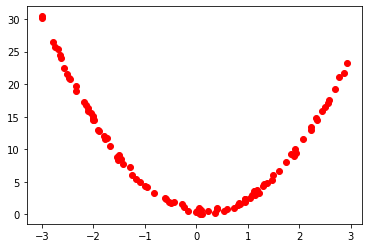

In [ ]:
plt.scatter(x[:,1], y,c="red");


***Defining mean square error function***

***This is your homework study about mean square error and implementation is done below(y_hat and y are numpy arrays and that's why calculation this way is possible).I am not gonna explain it further ***

In [ ]:
def mse(y_hat, y): return ((y_hat-y)**2).mean()


***calculating our predicted vlaue using random parameters denoted by y_hat***

In [ ]:
y_hat = x@b
mse(y_hat, y)


tensor(4961.8965)

***Showing initial condition of predicted and actual***

**Red**    --> Original

**Green**  --> Predicted

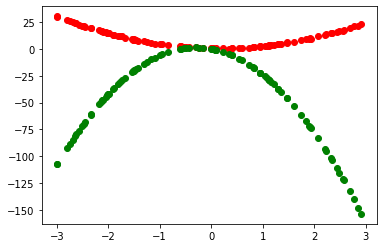

In [ ]:
plt.scatter(x[:,1],y,c="red")
plt.scatter(x[:,1],y_hat,c="green");

***Defining an update function which will update parameters when called***

In [ ]:
def update(lr):
    y_hat = x@b
    loss = mse(y, y_hat)
    loss.backward()
    with torch.no_grad():
        b.sub_(lr * b.grad)
        b.grad.zero_()

***Actual visualization of perfomance with learning rate 1e-2 and 150 epochs***

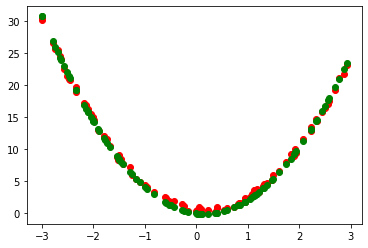

In [ ]:
b = nn.Parameter(tensor(-15.,-13.,4.))
lr = 1e-2
fig = plt.figure()
def animate(i):
    plt.clf()
    plt.scatter(x[:,1], y, c='red')
    my_y=x@b
    temp=my_y.detach().numpy()
   # print(my_y," ",y)
    update(lr) 
    return plt.scatter(x[:,1], temp,c="green")

animation.FuncAnimation(fig, animate, np.arange(0, 150), interval=1)

***Actual visualization of perfomance with learning rate 1e-3 and 150 epochs***

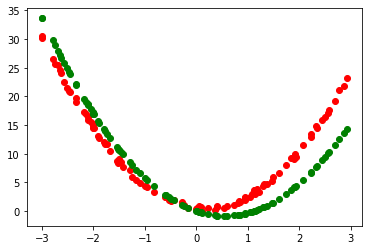

In [ ]:
b = nn.Parameter(tensor(-15.,-13.,4.))
lr = 1e-3
fig = plt.figure()
def animate(i):
    plt.clf()
    plt.scatter(x[:,1], y, c='red')
    my_y=x@b
    temp=my_y.detach().numpy()
   # print(my_y," ",y)
    update(lr) 
    return plt.scatter(x[:,1], temp,c="green")

animation.FuncAnimation(fig, animate, np.arange(0, 150), interval=1)

***Actual visualization of perfomance with learning rate 1e-3 and 250 epochs***

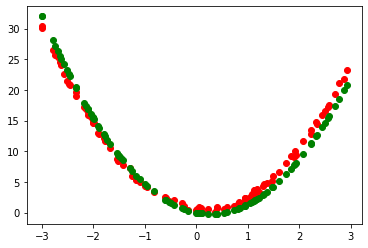

In [ ]:
b = nn.Parameter(tensor(-15.,-13.,4.))
lr = 1e-3
fig = plt.figure()
def animate(i):
  plt.clf()
  plt.scatter(x[:,1], y, c='red')
  my_y=x@b
  temp=my_y.detach().numpy()
  # print(my_y," ",y)
  update(lr) 
  return plt.scatter(x[:,1], temp,c="green")

animation.FuncAnimation(fig, animate, np.arange(0, 250), interval=1)

# ***Concept 2 more details about basics concept of neural networks***

***Components of deep Neural Network***
*   Input
*   Weight/Parameters
*   Activations
*   Activation Functions
*   Output
*   Loss
*   Metric
*   Cross-Entropy
*   Softmax
*   Fine tuniing

    Layer deletion and random Weights
    
    Freezing and Unfreezing










The first thing we pointed out is that there are only and exactly two types of layers -

***Parameters*** - These are layers that contain parameters/weights, also called as linear layers which maintain state,

For example, convolutions, linear.

Parameters are the things that your model learns, they’re the things that you use gradient descent to go.

***parameter = parameter - learning_rate * parameter.grad***

That’s our basic. That’s what we do.
And those parameters are used by multiplying them by input activations doing a matrix product.


***Activations***- These are layers that contain activations, also called as non-linear layers which are stateless. For example, ReLu or softmax.
We take some input activations or some layer activations and we multiply it by weight matrix to get a bunch of activations. Activations are numbers but they are calculated.


***Fine tuning***

What happens when we take a resnet50 and we do transfer learning. **What’s actually going on?**

The first thing to notice is the resnet50 that we grabbed from Imagenet has a very specific weight matrix at the end. It’s a weight matrix that has 1000 columns. Because in Imagenet competition you have to figure out which one of these 1000 image categories this picture belongs to. That’s why in Imagenet this target vector is of length 1000. You’ve got to pick the probability that it’s which one of those 1000 things.

There are 2 reasons this weight matrix is no good to you when you’re doing transfer learning.

We probably don’t have a thousand categories. We were trying to do digit classification and there were only 10 digits so we don’t want a thousand categories.

Even if we did have it exactly a 1000 categories they’re not the same 1000 categories that are in Imagenet.

So basically this whole weight matrix is a waste of time for us. What do we do we throw it away so when you go create_cnn() in fastai it deletes that. And instead, it puts in 2 new weight matrices in there for you with a ReLu in between.

So there are some defaults as to what size is the first one is but for the second one the size is as big as you need it to be. In your data bunch which you passed your learner from that, we know how many activations you need. If you’re doing classification it’s how many classes you have if you’re doing regression then how many numbers you’re trying to predict. Remember that in your if your data bunch is called data then that’ll be called

data.c

Fastai library will add for you this weight matrix of size data.c by however much was in the previous layer.

***Freezing layers - (Not updating weights)***


We definitely need to train these new weights because they’re random. Let’s not bother training any of the other weights at all. What we do when we freeze layers we are actually asking fastai and PyTorch that when we train however many epochs and when we call fit don’t backpropagate the gradients back into those layers.

In other words when you say

***weights = weights  -  weights.grad * learning rate***

Only do it for the new layers don’t bother doing it for the other layers. That is what freezing means.
Just don’t update those parameters. It’ll be a little bit faster because there are fewer calculations to do. It’ll take up a little bit less memory because there are fewer gradients that we have to store. But most importantly it’s not going to change weights that are already better than nothing. They’re better than random at the very least. that’s what happens when you call freeze. It doesn’t freeze the whole thing. It freezes everything except the randomly generated added layers that fastai puts on for us.

What happens next? After a while we say, this model is looking pretty good we probably should train the rest of the network now. So we unfreeze. Now we’re gonna train the whole thing but we still have a pretty good sense that these new layers we added to the end probably need more training and these ones right at the start that might just be like diagonal edges probably don’t need much training at all.

***Discriminative Learning rates and differential learning***

It is a method where you set different learning rates to different layers in the network during training. This is in contrast to how people normally configure the learning rate, which is to use the same rate throughout the network during training

To illustrate the concept a bit clearer, we can refer to the below diagram, where a pretrained model is split into 3 groups, where each group would be configured with an increasing learning rate value.

![alt text](https://miro.medium.com/proxy/1*4zrt6IeIhv55mUskGhXR7Q.png)

The intuition behind this method of configuration is that the first few layers would typically contain very granular details of the data, such as the lines and the edges — of which we normally wouldn’t want to change much and like to retain it’s information. As such, there’s not much need to change their weights by a big amount.

In contrast, in later layers such as the ones in green above — where we get detailed features of the data such as eyeballs or mouth or nose; we might not necessarily need to keep them.

Anywhere you can put a learning rate in fastai such as with the fit function.

You put in is the number of epochs

You put in is the learning rate.

Saying if you use fit one cycle the learning rate you can put a number of things that you can put.

a single number like (1e - 3)

Just using a single number means every layer gets the same learning rate so you’re not using discriminative learning rates.

you can write a slice, for example, 1e -3 with a single number (1e-3)

If you pass a single number to slice it means the final layers get a learning rate of (1e - 3) and then all the other layers get the same learning rate which is that divided by 3. All of the other layers will be (1e - 3) / 3 and
the last layers will be 1e - 3.

You can write slice with two numbers, (1e-3, 1e -5)

In the last case, the final layers the these randomly hidden added layers will still be again 1e - 3.
The first layers will get 1e - 5. The other layers will get learning rates that are equally spread between those two. Multiplicatively equal. If there were three layers there would be (1e - 5), (1e - 4) and (1e-3). Equal multiples each time.

One slight tweak to make things a little bit simpler to manage we don’t actually give a different learning rate to every layer. We give a different learning rate to every layer group which is just we decided to put the groups together for you. So specifically what we do is the randomly added extra layers we call those one layer group. This is by default you can modify it and then all the rest. We split in half into two layer groups. So by default at least with a CNN, you’ll get three layer groups. If you say slice (1e-5, 1e - 3), you will get (1e - 5) learning rate for the first layer group. 1e- 4 for the second one and 1e - 3 for the third. So now if you go back and look at the way that we’re training hopefully you’ll see that this makes a lot of sense. This divided by 3 thing that is a little weird and we won’t talk about why that is until part two of the course. it is specific quirk around batch normalization. We can discuss that in the advanced topic.
This is fine-tuning.

# ***Concept 3 how to build projects***